Import libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from transformers import (
    TimeSeriesTransformerConfig,
    TimeSeriesTransformerForPrediction,
    PretrainedConfig,
)
from gluonts.time_feature import (
    get_lags_for_frequency,
    get_seasonality,
    time_features_from_frequency_str,
)
from gluonts.dataset.pandas import PandasDataset
from gluonts.itertools import Map, Cyclic, Cached
from datasets import Dataset, DatasetDict, Features, Value, Sequence
from functools import lru_cache, partial
from gluonts.dataset.field_names import FieldName
from gluonts.transform import (
    AddAgeFeature,
    AddObservedValuesIndicator,
    AddTimeFeatures,
    AsNumpyArray,
    Chain,
    ExpectedNumInstanceSampler,
    InstanceSplitter,
    RemoveFields,
    TestSplitSampler,
    Transformation,
    ValidationSplitSampler,
    VstackFeatures,
    RenameFields,
)
from typing import Iterable

import torch
from gluonts.dataset.loader import as_stacked_batches
from gluonts.transform.sampler import InstanceSampler
from typing import Optional
from accelerate import Accelerator
from torch.optim import AdamW
from evaluate import load
import math
import matplotlib.dates as mdates

/home/samuell/.local/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/samuell/.local/lib/python3.10/site-packages/gluonts/json.py:101: UserWarning: Using `json`-module for json-handling. Consider installing one of `orjson`, `ujson` to speed up serialization and deserialization.
  warnings.warn(
2023-11-16 15:49:13.626802: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-11-16 15:49:13.705330: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-11-

Load dataset and prepare df

In [48]:
file_path = '../data/WHO-COVID-19-global-data.csv'
date_column='Date_reported'
target_column='New_deaths'
id_column = 'A'
df = pd.read_csv(file_path)[[date_column, target_column]]
df = df.groupby(date_column).sum().reset_index()
df = df.dropna()
df['A'] = 'A'
# df[date_column] = pd.to_datetime(df.pop(date_column), format='%Y-%m-%d')
df[date_column] = pd.to_datetime(df[date_column])
df[target_column] = df[target_column].fillna(0)

In [49]:
# pivot_df = df.pivot_table(index=date_column, columns=id_column, values=target_column)

# # Rename 'index' back to date_columneported
# df.rename(columns={'index': date_column}, inplace=True)
# df[date_column] = pd.to_datetime(df[date_column]).dt.date
unique_dates = df[date_column].unique()
df.set_index(date_column, inplace=True)

In [50]:
unique_dates = df.index.unique()
unique_dates

DatetimeIndex(['2020-01-03', '2020-01-04', '2020-01-05', '2020-01-06',
               '2020-01-07', '2020-01-08', '2020-01-09', '2020-01-10',
               '2020-01-11', '2020-01-12',
               ...
               '2023-10-31', '2023-11-01', '2023-11-02', '2023-11-03',
               '2023-11-04', '2023-11-05', '2023-11-06', '2023-11-07',
               '2023-11-08', '2023-11-09'],
              dtype='datetime64[ns]', name='Date_reported', length=1407, freq=None)

In [51]:
df_train = df[df.index < unique_dates[-60]]
df_validation = df[df.index < unique_dates[-30]]
df_test = df

In [93]:
ds_train = PandasDataset.from_long_dataframe(df_train, target=target_column, item_id=id_column)
ds_validation = PandasDataset.from_long_dataframe(df_validation, target=target_column, item_id=id_column)
ds_test = PandasDataset.from_long_dataframe(df_test, target=target_column, item_id=id_column)

TypeError: PandasDataset.from_long_dataframe() missing 1 required positional argument: 'item_id'

In [ ]:
class ProcessStartField():
    ts_id = 0
    
    def __call__(self, data):
        data["start"] = data["start"].to_timestamp()
        data["feat_static_cat"] = [self.ts_id]
        data["feat_dynamic_real"] = None
        # data["item_id"] = f"T{self.ts_id+1}"
        self.ts_id += 1
        
        return data

In [ ]:
process_start = ProcessStartField()
process_start.ts_id = 0
list_ds_train = list(Map(process_start, ds_train))
process_start.ts_id = 0
list_ds_validation = list(Map(process_start, ds_validation))
process_start.ts_id = 0
list_ds_test = list(Map(process_start, ds_test))

In [ ]:
features  = Features(
    {    
        "start": Value("timestamp[s]"),
        "target": Sequence(Value("float32")),
        "feat_static_cat": Sequence(Value("uint64")),
        # "feat_static_real":  Sequence(Value("float32")),
        "feat_dynamic_real": Sequence(Sequence(Value("uint64"))),
        # "feat_dynamic_cat": Sequence(Sequence(Value("uint64"))),
        "item_id": Value("string"),
    }
)

In [ ]:
train_dataset = Dataset.from_list(list_ds_train, features=features)
validation_dataset = Dataset.from_list(list_ds_validation, features=features)
test_dataset = Dataset.from_list(list_ds_test, features=features)

In [ ]:
dataset = DatasetDict({"train":train_dataset, "validation": validation_dataset, "test":test_dataset})
df_dataset = pd.DataFrame(dataset["train"])
df_dataset

,start,target,item_id,feat_static_cat,feat_dynamic_real
0,2020-01-03,"[0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",A,[0],None


In [ ]:
train_example = dataset['train'][0]
train_example.keys()
print(train_example['start'])
print(train_example['target'])

2020-01-03 00:00:00
[0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 1.0, 1.0, 2.0, 11.0, 1.0, 8.0, 16.0, 17.0, 26.0, 49.0, 2.0, 38.0, 42.0, 47.0, 106.0, 64.0, 67.0, 72.0, 70.0, 85.0, 87.0, 100.0, 107.0, 100.0, 5.0, 253.0, 152.0, 142.0, 105.0, 98.0, 139.0, 113.0, 125.0, 2.0, 209.0, 6.0, 160.0, 80.0, 62.0, 38.0, 58.0, 65.0, 56.0, 67.0, 68.0, 87.0, 87.0, 100.0, 102.0, 139.0, 222.0, 174.0, 269.0, 305.0, 320.0, 400.0, 964.0, 564.0, 587.0, 638.0, 792.0, 824.0, 1062.0, 5231.0, 1193.0, 1239.0, 1494.0, 1599.0, 1830.0, 2259.0, 12671.0, 2421.0, 2902.0, 3026.0, 3421.0, 3795.0, 4131.0, 17151.0, 4401.0, 4878.0, 4720.0, 5291.0, 5704.0, 5609.0, 17072.0, 5503.0, 5210.0, 5377.0, 5867.0, 6216.0, 7316.0, 14470.0, 5088.0, 5182.0, 5467.0, 5909.0, 5584.0, 5489.0, 11690.0, 4954.0, 4634.0, 4933.0, 5456.0, 5724.0, 5599.0, 9830.0, 4795.0, 4450.0, 4425.0, 6041.0, 5793.0, 5552.0, 7867.0, 5168.0, 4191.0, 4132.0, 5101.0, 4925.0, 5501.0, 7147.0, 4690.0, 3931.0, 4306.0, 5095.0, 5004.0,

In [ ]:
train_example.keys()

dict_keys(['start', 'target', 'item_id', 'feat_static_cat', 'feat_dynamic_real'])

In [ ]:
print(len(dataset['train'][0]['target']))
print(len(dataset['validation'][0]['target']))
print(len(dataset['test'][0]['target']))

1347
1377
1407


In [ ]:
train_dataset = dataset["train"]
test_dataset = dataset["test"]
print(len(train_dataset))

1


In [ ]:
validation_example = dataset['validation'][0]
validation_example.keys()

dict_keys(['start', 'target', 'item_id', 'feat_static_cat', 'feat_dynamic_real'])

In [ ]:
freq = "D"
prediction_length = 30
assert len(train_example["target"]) + prediction_length == len(
    validation_example["target"]
)

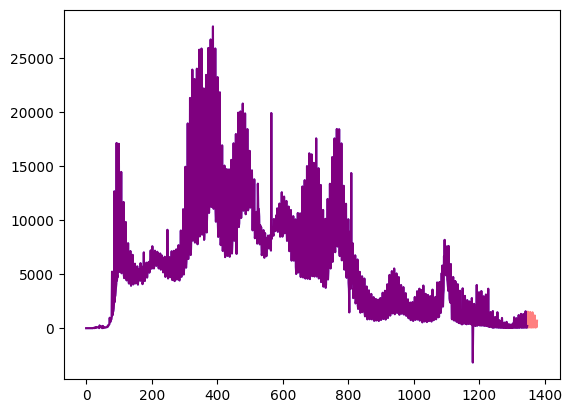

In [ ]:
figure, axes = plt.subplots()
axes.plot(train_example["target"], color="blue")
axes.plot(validation_example["target"], color="red", alpha=0.5)

plt.show()

In [ ]:
train_dataset = dataset["train"]
test_dataset = dataset["test"]

In [ ]:
@lru_cache(10_000)
def convert_to_pandas_period(date, freq):
    return pd.Period(date, freq)

def transform_start_field(batch, freq):
    batch["start"] = [convert_to_pandas_period(date, freq) for date in batch["start"]]
    return batch


In [ ]:
train_dataset.set_transform(partial(transform_start_field, freq=freq))
test_dataset.set_transform(partial(transform_start_field, freq=freq))


In [ ]:
lags_sequence = get_lags_for_frequency(freq)
print(lags_sequence)

[1, 2, 3, 4, 5, 6, 7, 8, 13, 14, 15, 20, 21, 22, 27, 28, 29, 30, 31, 56, 84, 363, 364, 365, 727, 728, 729, 1091, 1092, 1093]


In [ ]:
time_features = time_features_from_frequency_str(freq)
print(time_features)

[<function day_of_week at 0x7f6b014737f0>, <function day_of_month at 0x7f6b01473910>, <function day_of_year at 0x7f6b01473a30>]


In [ ]:
config = TimeSeriesTransformerConfig(
    prediction_length=prediction_length,
    # context length:
    context_length=prediction_length * 2,
    # lags coming from helper given the freq:
    lags_sequence=lags_sequence,
    # we'll add 2 time features ("month of year" and "age", see further):
    num_time_features=len(time_features) + 1,
    # we have a single static categorical feature, namely time series ID:
    num_static_categorical_features=1,
    # it has 366 possible values:
    cardinality=[len(train_dataset)],
    # the model will learn an embedding of size 2 for each of the 366 possible values:
    embedding_dimension=[2],
    
    # transformer params:
    encoder_layers=4,
    decoder_layers=4,
    d_model=32,
)

model = TimeSeriesTransformerForPrediction(config)

In [ ]:
def create_transformation(freq: str, config: PretrainedConfig) -> Transformation:
    remove_field_names = []
    if config.num_static_real_features == 0:
        remove_field_names.append(FieldName.FEAT_STATIC_REAL)
    if config.num_dynamic_real_features == 0:
        remove_field_names.append(FieldName.FEAT_DYNAMIC_REAL)
    if config.num_static_categorical_features == 0:
        remove_field_names.append(FieldName.FEAT_STATIC_CAT)

    # a bit like torchvision.transforms.Compose
    return Chain(
        # step 1: remove static/dynamic fields if not specified
        [RemoveFields(field_names=remove_field_names)]
        # step 2: convert the data to NumPy (potentially not needed)
        + (
            [
                AsNumpyArray(
                    field=FieldName.FEAT_STATIC_CAT,
                    expected_ndim=1,
                    dtype=int,
                )
            ]
            if config.num_static_categorical_features > 0
            else []
        )
        + (
            [
                AsNumpyArray(
                    field=FieldName.FEAT_STATIC_REAL,
                    expected_ndim=1,
                )
            ]
            if config.num_static_real_features > 0
            else []
        )
        + [
            AsNumpyArray(
                field=FieldName.TARGET,
                # we expect an extra dim for the multivariate case:
                expected_ndim=1 if config.input_size == 1 else 2,
            ),
            # step 3: handle the NaN's by filling in the target with zero
            # and return the mask (which is in the observed values)
            # true for observed values, false for nan's
            # the decoder uses this mask (no loss is incurred for unobserved values)
            # see loss_weights inside the xxxForPrediction model
            AddObservedValuesIndicator(
                target_field=FieldName.TARGET,
                output_field=FieldName.OBSERVED_VALUES,
            ),
            # step 4: add temporal features based on freq of the dataset
            # month of year in the case when freq="M"
            # these serve as positional encodings
            AddTimeFeatures(
                start_field=FieldName.START,
                target_field=FieldName.TARGET,
                output_field=FieldName.FEAT_TIME,
                time_features=time_features_from_frequency_str(freq),
                pred_length=config.prediction_length,
            ),
            # step 5: add another temporal feature (just a single number)
            # tells the model where in the life the value of the time series is
            # sort of running counter
            AddAgeFeature(
                target_field=FieldName.TARGET,
                output_field=FieldName.FEAT_AGE,
                pred_length=config.prediction_length,
                log_scale=True,
            ),
            # step 6: vertically stack all the temporal features into the key FEAT_TIME
            VstackFeatures(
                output_field=FieldName.FEAT_TIME,
                input_fields=[FieldName.FEAT_TIME, FieldName.FEAT_AGE]
                + (
                    [FieldName.FEAT_DYNAMIC_REAL]
                    if config.num_dynamic_real_features > 0
                    else []
                ),
            ),
            # step 7: rename to match HuggingFace names
            RenameFields(
                mapping={
                    FieldName.FEAT_STATIC_CAT: "static_categorical_features",
                    FieldName.FEAT_STATIC_REAL: "static_real_features",
                    FieldName.FEAT_TIME: "time_features",
                    FieldName.TARGET: "values",
                    FieldName.OBSERVED_VALUES: "observed_mask",
                }
            ),
        ]
    )

In [ ]:
def create_instance_splitter(
    config: PretrainedConfig,
    mode: str,
    train_sampler: Optional[InstanceSampler] = None,
    validation_sampler: Optional[InstanceSampler] = None,
) -> Transformation:
    assert mode in ["train", "validation", "test"]

    instance_sampler = {
        "train": train_sampler
        or ExpectedNumInstanceSampler(
            num_instances=1.0, min_future=config.prediction_length
        ),
        "validation": validation_sampler
        or ValidationSplitSampler(min_future=config.prediction_length),
        "test": TestSplitSampler(),
    }[mode]

    return InstanceSplitter(
        target_field="values",
        is_pad_field=FieldName.IS_PAD,
        start_field=FieldName.START,
        forecast_start_field=FieldName.FORECAST_START,
        instance_sampler=instance_sampler,
        past_length=config.context_length + max(config.lags_sequence),
        future_length=config.prediction_length,
        time_series_fields=["time_features", "observed_mask"],
    )

In [ ]:
def create_train_dataloader(
    config: PretrainedConfig,
    freq,
    data,
    batch_size: int,
    num_batches_per_epoch: int,
    shuffle_buffer_length: Optional[int] = None,
    cache_data: bool = True,
    **kwargs,
) -> Iterable:
    PREDICTION_INPUT_NAMES = [
        "past_time_features",
        "past_values",
        "past_observed_mask",
        "future_time_features",
    ]
    if config.num_static_categorical_features > 0:
        PREDICTION_INPUT_NAMES.append("static_categorical_features")

    if config.num_static_real_features > 0:
        PREDICTION_INPUT_NAMES.append("static_real_features")

    TRAINING_INPUT_NAMES = PREDICTION_INPUT_NAMES + [
        "future_values",
        "future_observed_mask",
    ]

    transformation = create_transformation(freq, config)
    transformed_data = transformation.apply(data, is_train=True)
    if cache_data:
        transformed_data = Cached(transformed_data)

    # we initialize a Training instance
    instance_splitter = create_instance_splitter(config, "train")

    # the instance splitter will sample a window of
    # context length + lags + prediction length (from the 366 possible transformed time series)
    # randomly from within the target time series and return an iterator.
    stream = Cyclic(transformed_data).stream()
    training_instances = instance_splitter.apply(
        stream, is_train=True
    )
    
    return as_stacked_batches(
        training_instances,
        batch_size=batch_size,
        shuffle_buffer_length=shuffle_buffer_length,
        field_names=TRAINING_INPUT_NAMES,
        output_type=torch.tensor,
        num_batches_per_epoch=num_batches_per_epoch,
    )

In [ ]:
def create_test_dataloader(
    config: PretrainedConfig,
    freq,
    data,
    batch_size: int,
    **kwargs,
):
    PREDICTION_INPUT_NAMES = [
        "past_time_features",
        "past_values",
        "past_observed_mask",
        "future_time_features",
    ]
    if config.num_static_categorical_features > 0:
        PREDICTION_INPUT_NAMES.append("static_categorical_features")

    if config.num_static_real_features > 0:
        PREDICTION_INPUT_NAMES.append("static_real_features")

    transformation = create_transformation(freq, config)
    transformed_data = transformation.apply(data, is_train=False)

    # we create a Test Instance splitter which will sample the very last
    # context window seen during training only for the encoder.
    instance_sampler = create_instance_splitter(config, "test")

    # we apply the transformations in test mode
    testing_instances = instance_sampler.apply(transformed_data, is_train=False)
    
    return as_stacked_batches(
        testing_instances,
        batch_size=batch_size,
        output_type=torch.tensor,
        field_names=PREDICTION_INPUT_NAMES,
    )

In [ ]:
train_dataloader = create_train_dataloader(
    config=config,
    freq=freq,
    data=train_dataset,
    batch_size=256,
    num_batches_per_epoch=100,
)

test_dataloader = create_test_dataloader(
    config=config,
    freq=freq,
    data=test_dataset,
    batch_size=64,
)

In [ ]:
batch = next(iter(train_dataloader))
for k, v in batch.items():
    print(k, v.shape, v.type())

past_time_features torch.Size([256, 1153, 4]) torch.FloatTensor
past_values torch.Size([256, 1153]) torch.FloatTensor
past_observed_mask torch.Size([256, 1153]) torch.FloatTensor
future_time_features torch.Size([256, 30, 4]) torch.FloatTensor
static_categorical_features torch.Size([256, 1]) torch.LongTensor
future_values torch.Size([256, 30]) torch.FloatTensor
future_observed_mask torch.Size([256, 30]) torch.FloatTensor


In [ ]:
# perform forward pass
outputs = model(
    past_values=batch["past_values"],
    past_time_features=batch["past_time_features"],
    past_observed_mask=batch["past_observed_mask"],
    static_categorical_features=batch["static_categorical_features"]
    if config.num_static_categorical_features > 0
    else None,
    static_real_features=batch["static_real_features"]
    if config.num_static_real_features > 0
    else None,
    future_values=batch["future_values"],
    future_time_features=batch["future_time_features"],
    future_observed_mask=batch["future_observed_mask"],
    output_hidden_states=True,
)


{'weight': Parameter containing:
tensor([[-0.0002, -0.0235]], requires_grad=True), 'input': tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]), 'padding_idx': -1, 'scale_grad_by_freq': False, 's

In [ ]:
print("Loss:", outputs.loss.item())

Loss: 10.105192184448242


In [94]:
accelerator = Accelerator()
device = accelerator.device

model.to(device)
optimizer = AdamW(model.parameters(), lr=6e-4, betas=(0.9, 0.95), weight_decay=1e-1)

model, optimizer, train_dataloader = accelerator.prepare(
    model,
    optimizer,
    train_dataloader,
)

model.train()
for epoch in range(40):
    for idx, batch in enumerate(train_dataloader):
        optimizer.zero_grad()
        outputs = model(
            static_categorical_features=batch["static_categorical_features"].to(device)
            if config.num_static_categorical_features > 0
            else None,
            static_real_features=batch["static_real_features"].to(device)
            if config.num_static_real_features > 0
            else None,
            past_time_features=batch["past_time_features"].to(device),
            past_values=batch["past_values"].to(device),
            future_time_features=batch["future_time_features"].to(device),
            future_values=batch["future_values"].to(device),
            past_observed_mask=batch["past_observed_mask"].to(device),
            future_observed_mask=batch["future_observed_mask"].to(device),
        )
        loss = outputs.loss

        # Backpropagation
        accelerator.backward(loss)
        optimizer.step()

        if idx % 100 == 0:
            print(loss.item())


{'weight': Parameter containing:
tensor([[-0.0156, -0.0176]], requires_grad=True), 'input': tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]), 'padding_idx': -1, 'scale_grad_by_freq': False, 's

In [95]:
model.eval()

forecasts = []

for batch in test_dataloader:
    # raise KeyError(batch)
    outputs = model.generate(
        static_categorical_features=batch["static_categorical_features"].to(device)
            if config.num_static_categorical_features > 0
            else None,
            static_real_features=batch["static_real_features"].to(device)
            if config.num_static_real_features > 0
            else None,
            past_time_features=batch["past_time_features"].to(device),
            past_values=batch["past_values"].to(device),
            future_time_features=batch["future_time_features"].to(device),
            past_observed_mask=batch["past_observed_mask"].to(device),
    )
    forecasts.append(outputs.sequences.cpu().numpy())


{'weight': Parameter containing:
tensor([[-0.0441, -0.0386]], requires_grad=True), 'input': tensor([0]), 'padding_idx': -1, 'scale_grad_by_freq': False, 'sparse': False}
{'weight': Parameter containing:
tensor([[ 0.0000,  0.0000,  0.0000,  ...,  1.0000,  1.0000,  1.0000],
        [ 0.8415,  0.5332,  0.3110,  ...,  1.0000,  1.0000,  1.0000],
        [ 0.9093,  0.9021,  0.5911,  ...,  1.0000,  1.0000,  1.0000],
        ...,
        [-0.8218, -0.9739,  0.6907,  ...,  0.9988,  0.9996,  0.9999],
        [ 0.0354, -0.7029,  0.4316,  ...,  0.9988,  0.9996,  0.9999],
        [ 0.8601, -0.2154,  0.1297,  ...,  0.9987,  0.9996,  0.9999]]), 'input': tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
        36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53,
        54, 55, 56, 57, 58, 59]), 'padding_idx': -1, 'scale_grad_by_freq': False, 'sparse': False}
{'weight': Par

{'weight': Parameter containing:
tensor([[ 0.0000,  0.0000,  0.0000,  ...,  1.0000,  1.0000,  1.0000],
        [ 0.8415,  0.5332,  0.3110,  ...,  1.0000,  1.0000,  1.0000],
        [ 0.9093,  0.9021,  0.5911,  ...,  1.0000,  1.0000,  1.0000],
        ...,
        [-0.8218, -0.9739,  0.6907,  ...,  0.9988,  0.9996,  0.9999],
        [ 0.0354, -0.7029,  0.4316,  ...,  0.9988,  0.9996,  0.9999],
        [ 0.8601, -0.2154,  0.1297,  ...,  0.9987,  0.9996,  0.9999]]), 'input': tensor([60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75]), 'padding_idx': -1, 'scale_grad_by_freq': False, 'sparse': False}
{'weight': Parameter containing:
tensor([[ 0.0000,  0.0000,  0.0000,  ...,  1.0000,  1.0000,  1.0000],
        [ 0.8415,  0.5332,  0.3110,  ...,  1.0000,  1.0000,  1.0000],
        [ 0.9093,  0.9021,  0.5911,  ...,  1.0000,  1.0000,  1.0000],
        ...,
        [-0.8218, -0.9739,  0.6907,  ...,  0.9988,  0.9996,  0.9999],
        [ 0.0354, -0.7029,  0.4316,  ...,  0.9988,  0.9996

In [96]:
forecasts[0].shape

(1, 100, 30)

In [97]:
forecasts = np.vstack(forecasts)
print(forecasts.shape)

(1, 100, 30)


In [98]:

mase_metric = load("evaluate-metric/mase")
smape_metric = load("evaluate-metric/smape")
mse_metric = load("evaluate-metric/mse")

forecast_median = np.median(forecasts, 1)

mase_metrics = []
smape_metrics = []
mse_metrics = []
for item_id, ts in enumerate(test_dataset):
    training_data = ts["target"][:-prediction_length]
    ground_truth = ts["target"][-prediction_length:]
    mase = mase_metric.compute(
        predictions=forecast_median[item_id], 
        references=np.array(ground_truth), 
        training=np.array(training_data), 
        periodicity=get_seasonality(freq))
    mase_metrics.append(mase["mase"])
    
    smape = smape_metric.compute(
        predictions=forecast_median[item_id], 
        references=np.array(ground_truth), 
    )
    smape_metrics.append(smape["smape"])
    
    mse = mse_metric.compute(
        predictions=forecast_median[item_id], 
        references=np.array(ground_truth), 
    )
    mse_metrics.append(mse["mse"])


In [99]:
print(f"MASE: {np.mean(mase_metrics)}")

MASE: 0.06510143783694697


In [100]:
print(f"sMAPE: {np.mean(smape_metrics)}")

sMAPE: 1.3483526323190493


In [101]:
print(f"MSE: {math.sqrt(np.mean(mse_metrics))}")

MSE: 243.6548566871851


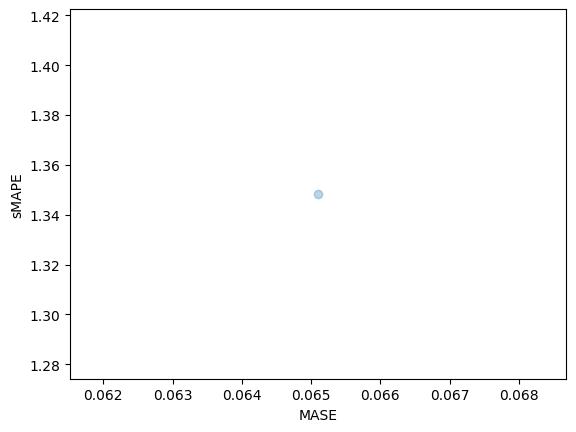

In [102]:
plt.scatter(mase_metrics, smape_metrics, alpha=0.3)
plt.xlabel("MASE")
plt.ylabel("sMAPE")
plt.show()

In [103]:
def plot(ts_index):
    fig, ax = plt.subplots()

    index = pd.period_range(
        start=test_dataset[ts_index][FieldName.START],
        periods=len(test_dataset[ts_index][FieldName.TARGET]),
        freq=freq,
    ).to_timestamp()

    # Major ticks every half year, minor ticks every month,
    ax.xaxis.set_major_locator(mdates.MonthLocator(bymonth=(1, 7)))
    ax.xaxis.set_minor_locator(mdates.MonthLocator())

    ax.plot(
        index[-2*prediction_length:], 
        test_dataset[ts_index]["target"][-2*prediction_length:],
        label="actual",
    )

    plt.plot(
        index[-prediction_length:], 
        np.median(forecasts[ts_index], axis=0),
        label="median",
    )
    
    plt.fill_between(
        index[-prediction_length:],
        forecasts[ts_index].mean(0) - forecasts[ts_index].std(axis=0), 
        forecasts[ts_index].mean(0) + forecasts[ts_index].std(axis=0), 
        alpha=0.3, 
        interpolate=True,
        label="+/- 1-std",
    )
    plt.legend()
    plt.show()


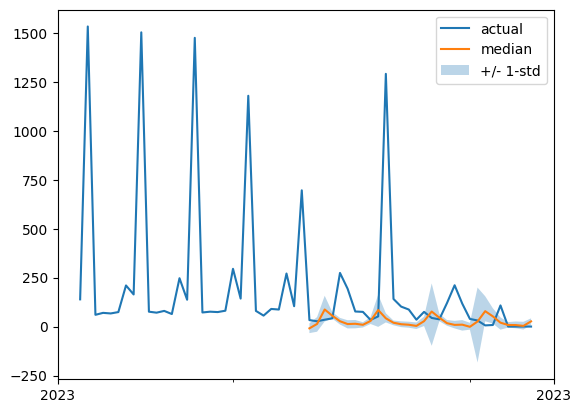

In [104]:
plot(0)


In [105]:
forecasts

array([[[111.78436  ,  10.518712 ,  60.75883  , ...,   2.0408971,
          12.660992 ,  47.833244 ],
        [  8.03097  , -18.45067  , 134.36491  , ...,  10.611257 ,
          16.782541 ,  20.78434  ],
        [  3.2814517,  16.773539 , 169.42548  , ...,  -1.3934263,
          -7.474443 ,  13.398908 ],
        ...,
        [-16.949625 ,  24.61601  ,  94.40697  , ...,   9.805471 ,
          -1.6134266,  30.993862 ],
        [  0.5218683,  10.417428 ,  44.428123 , ...,  13.092451 ,
         -11.521254 ,  20.321054 ],
        [ -6.680417 ,  -1.1619729, 106.58458  , ...,  51.61069  ,
           6.6462655,  11.950391 ]]], dtype=float32)